# Audit of Costa Rican Household Poverty Level Prediction
By Yuchen Liu and Roy Zhou

Original Kaggle Competition: https://www.kaggle.com/competitions/costa-rican-household-poverty-prediction

Automated Decision System: https://www.kaggle.com/code/skooch/xgboost

# Recreating the ADS
To audit the ADS, we first need to recreate it.

## Imports and Setup
First we import the data and define some helper functions that will be used later on. 

The dataset was provided by the Inter-American Development Bank for the purposes of the competition. The helper functions were written by the original author of the ADS.

In [ ]:
# imports
import numpy as np
import pandas as pd 

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 

import lightgbm as lgb
import xgboost as xgb
from sklearn.metrics import f1_score
from joblib import Parallel, delayed
from sklearn.base import clone
from sklearn.ensemble import VotingClassifier, ExtraTreesClassifier, RandomForestClassifier
from sklearn.utils import class_weight

import warnings
warnings.filterwarnings("ignore")

In [ ]:
from sklearn.preprocessing import LabelEncoder

# this only transforms the idhogar field, the other things this function used to do are done elsewhere
# idhogar = unique id for each household
def encode_data(df):
    df['idhogar'] = LabelEncoder().fit_transform(df['idhogar'])

# plot feature importance for sklearn decision trees    
def feature_importance(forest, X_train, display_results=True):
    ranked_list = []
    zero_features = []
    
    importances = forest.feature_importances_

    indices = np.argsort(importances)[::-1]
    
    if display_results:
        # Print the feature ranking
        print("Feature ranking:")

    for f in range(X_train.shape[1]):
        if display_results:
            print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]) + " - " + X_train.columns[indices[f]])
        
        ranked_list.append(X_train.columns[indices[f]])
        
        if importances[indices[f]] == 0.0:
            zero_features.append(X_train.columns[indices[f]])
            
    return ranked_list, zero_features


In [ ]:
def do_features(df):
    feats_div = [('children_fraction', 'r4t1', 'r4t3'), 
                 ('working_man_fraction', 'r4h2', 'r4t3'),
                 ('all_man_fraction', 'r4h3', 'r4t3'),
                 ('human_density', 'tamviv', 'rooms'),
                 ('human_bed_density', 'tamviv', 'bedrooms'),
                 ('rent_per_person', 'v2a1', 'r4t3'),
                 ('rent_per_room', 'v2a1', 'rooms'),
                 ('mobile_density', 'qmobilephone', 'r4t3'),
                 ('tablet_density', 'v18q1', 'r4t3'),
                 ('mobile_adult_density', 'qmobilephone', 'r4t2'),
                 ('tablet_adult_density', 'v18q1', 'r4t2'),
                ]
    
    feats_sub = [('people_not_living', 'tamhog', 'tamviv'),
                 ('people_weird_stat', 'tamhog', 'r4t3')]

    for f_new, f1, f2 in feats_div:
        df['fe_' + f_new] = (df[f1] / df[f2]).astype(np.float32)       
    for f_new, f1, f2 in feats_sub:
        df['fe_' + f_new] = (df[f1] - df[f2]).astype(np.float32)
    
    # aggregation rules over household
    aggs_num = {'age': ['min', 'max', 'mean'],
                'escolari': ['min', 'max', 'mean']
               }
    
    aggs_cat = {'dis': ['mean']}
    for s_ in ['estadocivil', 'parentesco', 'instlevel']:
        for f_ in [f_ for f_ in df.columns if f_.startswith(s_)]:
            aggs_cat[f_] = ['mean', 'count']

    # aggregation over household
    for name_, df_ in [('18', df.query('age >= 18'))]:
        df_agg = df_.groupby('idhogar').agg({**aggs_num, **aggs_cat}).astype(np.float32)
        df_agg.columns = pd.Index(['agg' + name_ + '_' + e[0] + "_" + e[1].upper() for e in df_agg.columns.tolist()])
        df = df.join(df_agg, how='left', on='idhogar')
        del df_agg

    # Drop id's
    df.drop(['Id'], axis=1, inplace=True)
    
    return df

In [ ]:
# convert one hot encoded fields to label encoding
def convert_OHE2LE(df):
    tmp_df = df.copy(deep=True)
    for s_ in ['pared', 'piso', 'techo', 'abastagua', 'sanitario', 'energcocinar', 'elimbasu', 
               'epared', 'etecho', 'eviv', 'estadocivil', 'parentesco', 
               'instlevel', 'lugar', 'tipovivi',
               'manual_elec']:
        if 'manual_' not in s_:
            cols_s_ = [f_ for f_ in df.columns if f_.startswith(s_)]
        elif 'elec' in s_:
            cols_s_ = ['public', 'planpri', 'noelec', 'coopele']
        sum_ohe = tmp_df[cols_s_].sum(axis=1).unique()
        #deal with those OHE, where there is a sum over columns == 0
        if 0 in sum_ohe:
            print('The OHE in {} is incomplete. A new column will be added before label encoding'
                  .format(s_))
            # dummy colmn name to be added
            col_dummy = s_+'_dummy'
            # add the column to the dataframe
            tmp_df[col_dummy] = (tmp_df[cols_s_].sum(axis=1) == 0).astype(np.int8)
            # add the name to the list of columns to be label-encoded
            cols_s_.append(col_dummy)
            # proof-check, that now the category is complete
            sum_ohe = tmp_df[cols_s_].sum(axis=1).unique()
            if 0 in sum_ohe:
                 print("The category completion did not work")
        tmp_cat = tmp_df[cols_s_].idxmax(axis=1)
        tmp_df[s_ + '_LE'] = LabelEncoder().fit_transform(tmp_cat).astype(np.int16)
        if 'parentesco1' in cols_s_:
            cols_s_.remove('parentesco1')
        tmp_df.drop(cols_s_, axis=1, inplace=True)
    return tmp_df

In [ ]:
# mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')
path = 'drive/MyDrive/responsible project/draft report/'

# reading in the data
train = pd.read_csv(path + 'train.csv')
test = pd.read_csv(path + 'test.csv')
test_ids = test.Id

train.head()

Mounted at /content/drive


,Id,v2a1,hacdor,rooms,hacapo,v14a,refrig,v18q,v18q1,r4h1,...,SQBescolari,SQBage,SQBhogar_total,SQBedjefe,SQBhogar_nin,SQBovercrowding,SQBdependency,SQBmeaned,agesq,Target
0,ID_279628684,190000.0,0,3,0,1,1,0,NaN,0,...,100,1849,1,100,0,1.000000,0.0,100.0,1849,4
1,ID_f29eb3ddd,135000.0,0,4,0,1,1,1,1.0,0,...,144,4489,1,144,0,1.000000,64.0,144.0,4489,4
2,ID_68de51c94,NaN,0,8,0,1,1,0,NaN,0,...,121,8464,1,0,0,0.250000,64.0,121.0,8464,4
3,ID_d671db89c,180000.0,0,5,0,1,1,1,1.0,0,...,81,289,16,121,4,1.777778,1.0,121.0,289,4
4,ID_d56d6f5f5,180000.0,0,5,0,1,1,1,1.0,0,...,121,1369,16,121,4,1.777778,1.0,121.0,1369,4


## Exploratory data analysis
This was done by us to get a better understanding of the data we were working with.

In [ ]:
# getting the data type of each column
train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9557 entries, 0 to 9556
Data columns (total 143 columns):
 #    Column           Dtype  
---   ------           -----  
 0    Id               object 
 1    v2a1             float64
 2    hacdor           int64  
 3    rooms            int64  
 4    hacapo           int64  
 5    v14a             int64  
 6    refrig           int64  
 7    v18q             int64  
 8    v18q1            float64
 9    r4h1             int64  
 10   r4h2             int64  
 11   r4h3             int64  
 12   r4m1             int64  
 13   r4m2             int64  
 14   r4m3             int64  
 15   r4t1             int64  
 16   r4t2             int64  
 17   r4t3             int64  
 18   tamhog           int64  
 19   tamviv           int64  
 20   escolari         int64  
 21   rez_esc          float64
 22   hhsize           int64  
 23   paredblolad      int64  
 24   paredzocalo      int64  
 25   paredpreb        int64  
 26   pareddes         i

In [ ]:
# shape of the training data
train.shape

(9557, 143)

<Axes: >

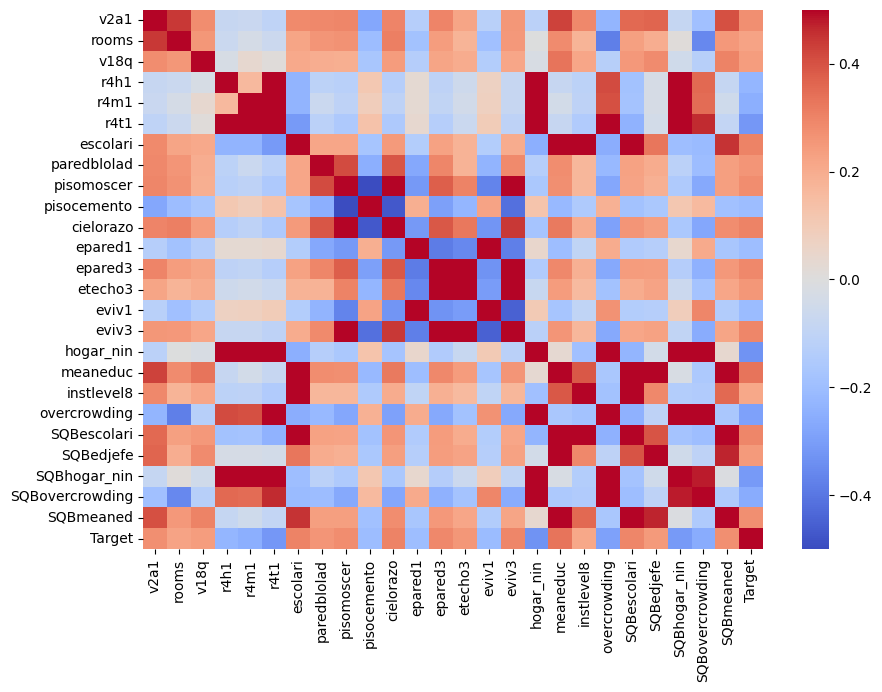

In [ ]:
# correlation heatmap of the most correlated features
XY = pd.concat([train.drop('Target', axis=1), train['Target']], axis=1)
max_corr = XY.corr()['Target'].loc[lambda x: abs(x)>0.2].index

plt.figure(figsize=(10,7))
sns.heatmap(XY[max_corr].corr(), vmin=-0.5, vmax=0.5, cmap='coolwarm')

### Some Interesting Distributions:

Text(0.5, 0, 'economic situation')

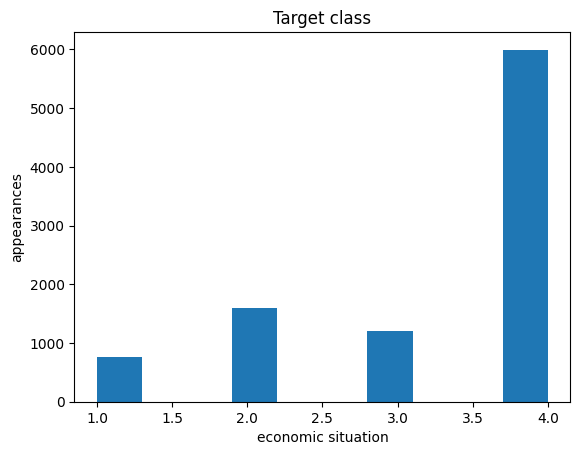

In [ ]:
plt.hist(train['Target'])
plt.title('Target class')
plt.ylabel('appearances')
plt.xlabel('economic situation')

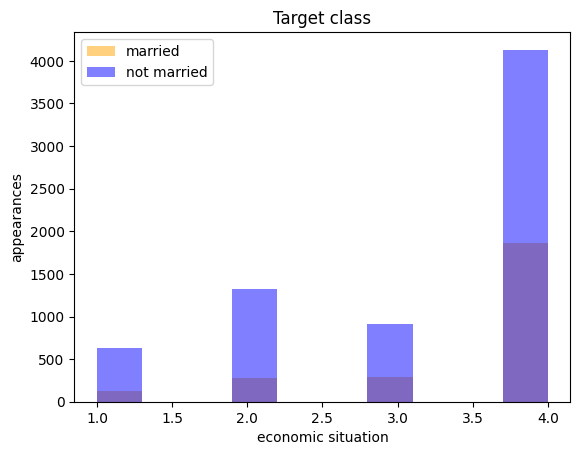

In [ ]:
# estadocivil3 is marital status
plt.hist(train[train['estadocivil3']==1]['Target'],color='orange', alpha=0.5, label='married')
plt.hist(train[train['estadocivil3']==0]['Target'],color='blue', alpha=0.5, label='not married')
plt.title('Target class')
plt.ylabel('appearances')
plt.xlabel('economic situation')
plt.legend()

"married" has a more balanced target class than "unmarried". 

For "married", target 2 and 3 are extremely similar, while there are more 2s for "unmarried". Also, there's a smaller difference in number of 4s for "married".

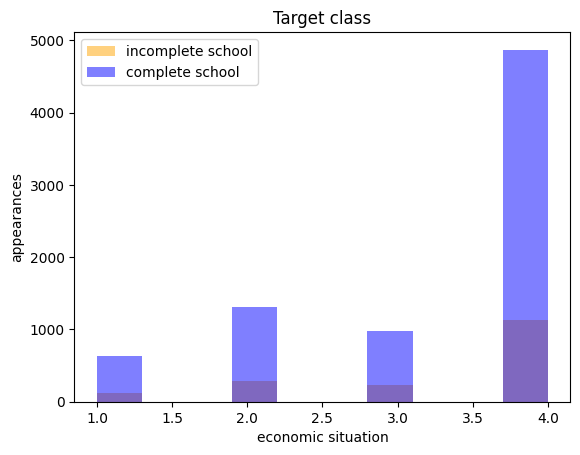

In [ ]:
# instlevel4 is incompletness of secondary school
plt.hist(train[train['instlevel4']==1]['Target'],color='orange', alpha=0.5, label='incomplete school')
plt.hist(train[train['instlevel4']==0]['Target'],color='blue', alpha=0.5, label='complete school')
plt.title('Target class')
plt.ylabel('appearances')
plt.xlabel('economic situation')
plt.legend()

There still exists majority of non-vulnerable household after grouping by education. 

### Missing/Empty Data

In [ ]:
print(f'Missing values for v2a1: {train["v2a1"].isna().sum()}')
print(f'Total number of values for v2a1: {len(train["v2a1"])}')

Missing values for v2a1: 6860
Total number of values for v2a1: 9557


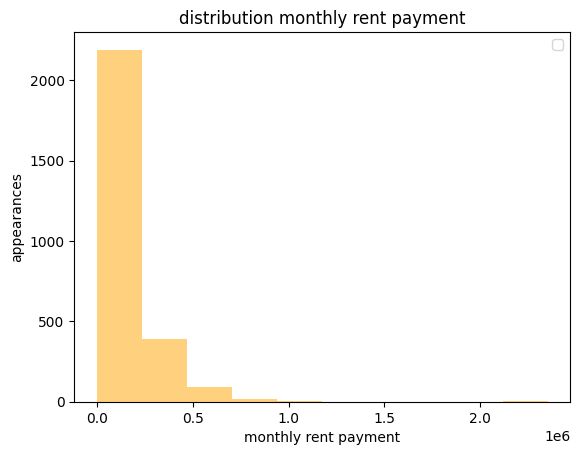

In [ ]:
plt.hist(train['v2a1'],color='orange', alpha=0.5)
plt.title('distribution monthly rent payment')
plt.ylabel('appearances')
plt.xlabel('monthly rent payment')
plt.legend()

## Preprocessing the data
This was done by the original author to prepare the data for the machine learning model.

In [ ]:
def process_df(df_):
    # encode the idhogar
    encode_data(df_)
    
    # create aggregate features
    return do_features(df_)

train = process_df(train)
test = process_df(test)

Text(0, 0.5, 'appearances')

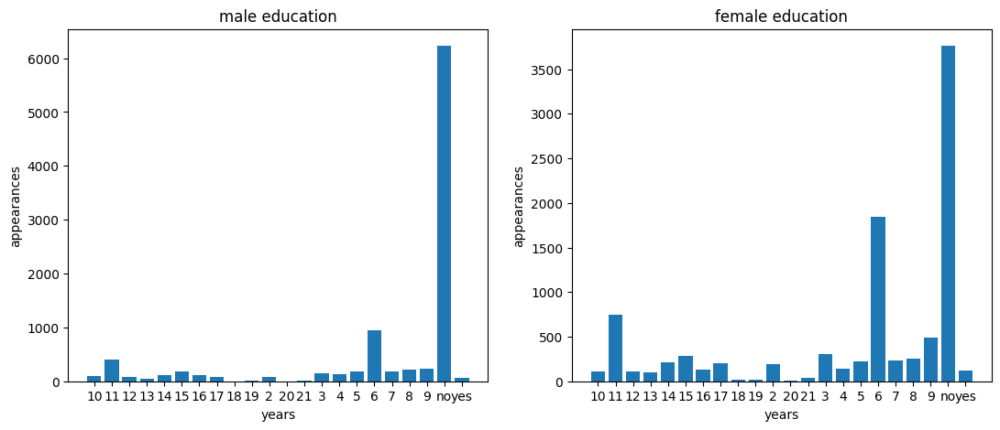

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(13,5))
male_years = train.groupby('edjefa')['edjefa'].count()
female_years = train.groupby('edjefe')['edjefe'].count()
axes[0].bar(male_years.keys(), male_years.values)
axes[0].set_title('male education')
axes[0].set_xlabel('years')
axes[0].set_ylabel('appearances')

axes[1].bar(female_years.keys(), female_years.values)
axes[1].set_title('female education')
axes[1].set_xlabel('years')
axes[1].set_ylabel('appearances')

In [ ]:
def years_mean(df):
  total = 0  
  count = 0
  for k,v in df.iteritems():
    if k=='no' or k=='yes':continue
    k = int(k)
    count += v
    total += k * v
  return total / count

male_years_mean = years_mean(male_years)
female_years_mean = years_mean(female_years)
print(f'Male average years of education: {male_years_mean: .2f}')
print(f'Female average years of education: {female_years_mean:.2f}')

Male average years of education:  8.48
Female average years of education: 8.57


In [ ]:
# analyze rent distribution before ADS's imputation
print('Before imputation')
print(f'Mean of monthly rent: {train["v2a1"].mean():.2f}')


Before imputation
Mean of monthly rent: 165231.61


In [ ]:
# some dependencies are Na, fill those with the square root of the square
train['dependency'] = np.sqrt(train['SQBdependency'])
test['dependency'] = np.sqrt(test['SQBdependency'])

# fill "no"s for education with 0s
train.loc[train['edjefa'] == "no", "edjefa"] = 0
train.loc[train['edjefe'] == "no", "edjefe"] = 0
test.loc[test['edjefa'] == "no", "edjefa"] = 0
test.loc[test['edjefe'] == "no", "edjefe"] = 0

# if education is "yes" and person is head of household, fill with escolari
train.loc[(train['edjefa'] == "yes") & (train['parentesco1'] == 1), "edjefa"] = train.loc[(train['edjefa'] == "yes") & (train['parentesco1'] == 1), "escolari"]
train.loc[(train['edjefe'] == "yes") & (train['parentesco1'] == 1), "edjefe"] = train.loc[(train['edjefe'] == "yes") & (train['parentesco1'] == 1), "escolari"]

test.loc[(test['edjefa'] == "yes") & (test['parentesco1'] == 1), "edjefa"] = test.loc[(test['edjefa'] == "yes") & (test['parentesco1'] == 1), "escolari"]
test.loc[(test['edjefe'] == "yes") & (test['parentesco1'] == 1), "edjefe"] = test.loc[(test['edjefe'] == "yes") & (test['parentesco1'] == 1), "escolari"]

# this field is supposed to be interaction between gender and escolari, but it isn't clear what "yes" means, let's fill it with 4
train.loc[train['edjefa'] == "yes", "edjefa"] = 4
train.loc[train['edjefe'] == "yes", "edjefe"] = 4

test.loc[test['edjefa'] == "yes", "edjefa"] = 4
test.loc[test['edjefe'] == "yes", "edjefe"] = 4

# convert to int for our models
train['edjefe'] = train['edjefe'].astype("int")
train['edjefa'] = train['edjefa'].astype("int")
test['edjefe'] = test['edjefe'].astype("int")
test['edjefa'] = test['edjefa'].astype("int")

# create feature with max education of either head of household
train['edjef'] = np.max(train[['edjefa','edjefe']], axis=1)
test['edjef'] = np.max(test[['edjefa','edjefe']], axis=1)

# fill some nas
train['v2a1']=train['v2a1'].fillna(0)
test['v2a1']=test['v2a1'].fillna(0)

test['v18q1']=test['v18q1'].fillna(0)
train['v18q1']=train['v18q1'].fillna(0)

train['rez_esc']=train['rez_esc'].fillna(0)
test['rez_esc']=test['rez_esc'].fillna(0)

train.loc[train.meaneduc.isnull(), "meaneduc"] = 0
train.loc[train.SQBmeaned.isnull(), "SQBmeaned"] = 0

test.loc[test.meaneduc.isnull(), "meaneduc"] = 0
test.loc[test.SQBmeaned.isnull(), "SQBmeaned"] = 0

# fix some inconsistencies in the data - some rows indicate both that the household does and does not have a toilet, 
# if there is no water we'll assume they do not
train.loc[(train.v14a ==  1) & (train.sanitario1 ==  1) & (train.abastaguano == 0), "v14a"] = 0
train.loc[(train.v14a ==  1) & (train.sanitario1 ==  1) & (train.abastaguano == 0), "sanitario1"] = 0

test.loc[(test.v14a ==  1) & (test.sanitario1 ==  1) & (test.abastaguano == 0), "v14a"] = 0
test.loc[(test.v14a ==  1) & (test.sanitario1 ==  1) & (test.abastaguano == 0), "sanitario1"] = 0

After imputation
Mean of monthly rent: 46628.61


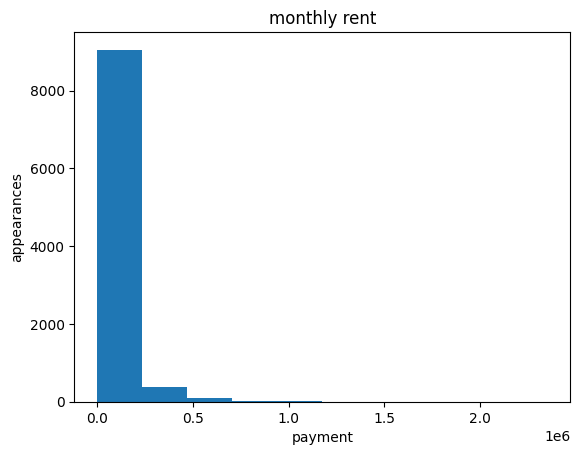

In [ ]:
plt.hist(train['v2a1'])
plt.title('monthly rent')
plt.xlabel('payment')
plt.ylabel('appearances')
print('After imputation')
print(f'Mean of monthly rent: {train["v2a1"].mean():.2f}')

In [ ]:
def train_test_apply_func(train_, test_, func_):
    test_['Target'] = 0
    xx = pd.concat([train_, test_])

    xx_func = func_(xx)
    train_ = xx_func.iloc[:train_.shape[0], :]
    test_  = xx_func.iloc[train_.shape[0]:, :].drop('Target', axis=1)

    del xx, xx_func
    return train_, test_

In [ ]:
# convert the one hot fields into label encoded
train, test = train_test_apply_func(train, test, convert_OHE2LE)

The OHE in techo is incomplete. A new column will be added before label encoding
The OHE in instlevel is incomplete. A new column will be added before label encoding
The OHE in manual_elec is incomplete. A new column will be added before label encoding


In [ ]:
cols_2_ohe = ['eviv_LE', 'etecho_LE', 'epared_LE', 'elimbasu_LE', 
              'energcocinar_LE', 'sanitario_LE', 'manual_elec_LE',
              'pared_LE']
cols_nums = ['age', 'meaneduc', 'dependency', 
             'hogar_nin', 'hogar_adul', 'hogar_mayor', 'hogar_total',
             'bedrooms', 'overcrowding']

def convert_geo2aggs(df_):
    tmp_df = pd.concat([df_[(['lugar_LE', 'idhogar']+cols_nums)],
                        pd.get_dummies(df_[cols_2_ohe], 
                                       columns=cols_2_ohe)],axis=1)

    geo_agg = tmp_df.groupby(['lugar_LE','idhogar']).mean().groupby('lugar_LE').mean().astype(np.float32)
    geo_agg.columns = pd.Index(['geo_' + e for e in geo_agg.columns.tolist()])
    
    del tmp_df
    return df_.join(geo_agg, how='left', on='lugar_LE')

# add some aggregates by geography
train, test = train_test_apply_func(train, test, convert_geo2aggs)

In [ ]:
# add the number of people over 18 in each household
train['num_over_18'] = 0
train['num_over_18'] = train[train.age >= 18].groupby('idhogar').transform("count")['num_over_18']
train['num_over_18'] = train.groupby("idhogar")["num_over_18"].transform("max")
train['num_over_18'] = train['num_over_18'].fillna(0)

test['num_over_18'] = 0
test['num_over_18'] = test[test.age >= 18].groupby('idhogar').transform("count")['num_over_18']
test['num_over_18'] = test.groupby("idhogar")["num_over_18"].transform("max")
test['num_over_18'] = test['num_over_18'].fillna(0)

# add some extra features, these were taken from another kernel
def extract_features(df):
    df['bedrooms_to_rooms'] = df['bedrooms']/df['rooms']
    df['rent_to_rooms'] = df['v2a1']/df['rooms']
    df['tamhog_to_rooms'] = df['tamhog']/df['rooms'] # tamhog - size of the household
    df['r4t3_to_tamhog'] = df['r4t3']/df['tamhog'] # r4t3 - Total persons in the household
    df['r4t3_to_rooms'] = df['r4t3']/df['rooms'] # r4t3 - Total persons in the household
    df['v2a1_to_r4t3'] = df['v2a1']/df['r4t3'] # rent to people in household
    df['v2a1_to_r4t3'] = df['v2a1']/(df['r4t3'] - df['r4t1']) # rent to people under age 12
    df['hhsize_to_rooms'] = df['hhsize']/df['rooms'] # rooms per person
    df['rent_to_hhsize'] = df['v2a1']/df['hhsize'] # rent to household size
    df['rent_to_over_18'] = df['v2a1']/df['num_over_18']
    # some households have no one over 18, use the total rent for those
    df.loc[df.num_over_18 == 0, "rent_to_over_18"] = df[df.num_over_18 == 0].v2a1
    
extract_features(train)    
extract_features(test)

In [ ]:
female_corr = train.corrwith(train['male']).sort_values()
print('Female correlations:')
print(female_corr.sort_values().head())
print(female_corr.sort_values(ascending=False).head())
print()


Female correlations:
female   -1.000000
r4m3     -0.251613
r4m2     -0.212105
r4m1     -0.152477
edjefa   -0.139837
dtype: float64
male                       1.000000
fe_all_man_fraction        0.441507
fe_working_man_fraction    0.356767
r4h3                       0.268743
r4h2                       0.244961
dtype: float64



In [ ]:
age_corr = train.corrwith(train['age'])
print('Age correlations:')
print(age_corr.sort_values().head())
print(age_corr.sort_values(ascending=False).head())
print()

Age correlations:
parentesco_LE          -0.504157
hogar_nin              -0.475977
fe_children_fraction   -0.463795
r4t1                   -0.423818
r4m1                   -0.329512
dtype: float64
age               1.000000
SQBage            0.958090
agesq             0.958090
agg18_age_MEAN    0.639770
agg18_age_MAX     0.565896
dtype: float64



In [ ]:
def split_data(train, y, sample_weight=None, households=None, test_percentage=0.20, seed=None):
    # uncomment for extra randomness
#     np.random.seed(seed=seed)
    
    train2 = train.copy()
    
    # pick some random households to use for the test data
    cv_hhs = np.random.choice(households, size=int(len(households) * test_percentage), replace=False)
    
    # select households which are in the random selection
    cv_idx = np.isin(households, cv_hhs)
    X_test = train2[cv_idx]
    y_test = y[cv_idx]

    X_train = train2[~cv_idx]
    y_train = y[~cv_idx]
    
    if sample_weight is not None:
        y_train_weights = sample_weight[~cv_idx]
        return X_train, y_train, X_test, y_test, y_train_weights
    
    return X_train, y_train, X_test, y_test

In [ ]:
# parentescoe = whether person is head of household
X = train.query('parentesco1==1')
# X = train.copy()

# pull out and drop the target variable
y = X['Target'] - 1
X = X.drop(['Target'], axis=1)

np.random.seed(seed=None)

train2 = X.copy()

train_hhs = train2.idhogar

households = train2.idhogar.unique()
cv_hhs = np.random.choice(households, size=int(len(households) * 0.15), replace=False)

cv_idx = np.isin(train2.idhogar, cv_hhs)

X_test = train2[cv_idx]
y_test = y[cv_idx]

X_train = train2[~cv_idx]
y_train = y[~cv_idx]

# train on entire dataset
X_train = train2
y_train = y

train_households = X_train.idhogar

In [ ]:
# figure out the class weights for training with unbalanced classes
y_train_weights = class_weight.compute_sample_weight('balanced', y_train, indices=None)

In [ ]:
# drop some features which aren't used by the LGBM or have very low importance
extra_drop_features = [
 'agg18_estadocivil1_MEAN',
 'agg18_estadocivil6_COUNT',
 'agg18_estadocivil7_COUNT',
 'agg18_parentesco10_COUNT',
 'agg18_parentesco11_COUNT',
 'agg18_parentesco12_COUNT',
 'agg18_parentesco1_COUNT',
 'agg18_parentesco2_COUNT',
 'agg18_parentesco3_COUNT',
 'agg18_parentesco4_COUNT',
 'agg18_parentesco5_COUNT',
 'agg18_parentesco6_COUNT',
 'agg18_parentesco7_COUNT',
 'agg18_parentesco8_COUNT',
 'agg18_parentesco9_COUNT',
 'geo_elimbasu_LE_4',
 'geo_energcocinar_LE_1',
 'geo_energcocinar_LE_2',
 'geo_epared_LE_0',
 'geo_hogar_mayor',
 'geo_manual_elec_LE_2',
 'geo_pared_LE_3',
 'geo_pared_LE_4',
 'geo_pared_LE_5',
 'geo_pared_LE_6',
 'num_over_18',
 'parentesco_LE',
 'rez_esc']

In [ ]:
xgb_drop_cols = extra_drop_features + ["idhogar",  'parentesco1']

## Fit a Voting Classifier
This is the VotingClassifier model that will be trained to make predictions on household poverty level. The model combines the predictions from individual XGBClassifiers.

In [ ]:
# These opt_parameters are for xgboost
# 4
opt_parameters = {'max_depth':35, 'eta':0.1, 'silent':0, 'objective':'multi:softmax', 'min_child_weight': 1, 'num_class': 4, 'gamma': 2.0, 'colsample_bylevel': 0.9, 'subsample': 0.84, 'colsample_bytree': 0.88, 'reg_lambda': 0.40 }
# 5
opt_parameters = {'max_depth':35, 'eta':0.15, 'silent':1, 'objective':'multi:softmax', 'min_child_weight': 2, 'num_class': 4, 'gamma': 2.5, 'colsample_bylevel': 1, 'subsample': 0.95, 'colsample_bytree': 0.85, 'reg_lambda': 0.35 }
# 6
# opt_parameters = {'max_depth':35, 'eta':0.15, 'silent':0, 'objective':'multi:softmax', 'min_child_weight': 2, 'num_class': 4, 'gamma': 2.75, 'colsample_bylevel': 0.95, 'subsample': 0.95, 'colsample_bytree': 0.85, 'reg_lambda': 0.35 }
# # 7
# opt_parameters = {'max_depth':35, 'eta':0.12, 'silent':0, 'objective':'multi:softmax', 'min_child_weight': 2, 'num_class': 4, 'gamma': 3.25, 'colsample_bylevel': 0.95, 'subsample': 0.88, 'colsample_bytree': 0.88, 'reg_lambda': 0.35 }

def evaluate_macroF1_lgb(predictions, truth):  
    # this follows the discussion in https://github.com/Microsoft/LightGBM/issues/1483
    pred_labels = predictions.argmax(axis=1)
    truth = truth.get_label()
    f1 = f1_score(truth, pred_labels, average='macro')
    return ('macroF1', 1-f1) 

fit_params={"early_stopping_rounds":500,
            "eval_metric" : evaluate_macroF1_lgb, 
            "eval_set" : [(X_train,y_train), (X_test,y_test)],
            'verbose': False,
           }

def learning_rate_power_0997(current_iter):
    base_learning_rate = 0.1
    min_learning_rate = 0.02
    lr = base_learning_rate  * np.power(.995, current_iter)
    return max(lr, min_learning_rate)

fit_params['verbose'] = 50

In [ ]:
np.random.seed(100)

def _parallel_fit_estimator(estimator1, X, y, sample_weight=None, threshold=True, **fit_params):
    estimator = clone(estimator1)
    
    # randomly split the data so we have a test set for early stopping
    if sample_weight is not None:
        X_train, y_train, X_test, y_test, y_train_weight = split_data(X, y, sample_weight, households=train_households)
    else:
        X_train, y_train, X_test, y_test = split_data(X, y, None, households=train_households)
        
    # update the fit params with our new split
    fit_params["eval_set"] = [(X_test,y_test)]
    
    # fit the estimator
    if sample_weight is not None:
        if isinstance(estimator1, ExtraTreesClassifier) or isinstance(estimator1, RandomForestClassifier):
            estimator.fit(X_train, y_train)
        else:
            _ = estimator.fit(X_train, y_train, sample_weight=y_train_weight, **fit_params)
    else:
        if isinstance(estimator1, ExtraTreesClassifier) or isinstance(estimator1, RandomForestClassifier):
            estimator.fit(X_train, y_train)
        else:
            _ = estimator.fit(X_train, y_train, **fit_params)
    
    if not isinstance(estimator1, ExtraTreesClassifier) and not isinstance(estimator1, RandomForestClassifier) and not isinstance(estimator1, xgb.XGBClassifier):
        best_cv_round = np.argmax(estimator.evals_result_['validation_0']['mlogloss'])
        best_cv = np.max(estimator.evals_result_['validation_0']['mlogloss'])
        best_train = estimator.evals_result_['train']['macroF1'][best_cv_round]
    else:
        best_train = f1_score(y_train, estimator.predict(X_train), average="macro")
        best_cv = f1_score(y_test, estimator.predict(X_test), average="macro")
        print("Train F1:", best_train)
        print("Test F1:", best_cv)
        
    # reject some estimators based on their performance on train and test sets
    if threshold:
        # if the valid score is very high we'll allow a little more leeway with the train scores
        if ((best_cv > 0.37) and (best_train > 0.75)) or ((best_cv > 0.44) and (best_train > 0.65)):
            return estimator

        # else recurse until we get a better one
        else:
            print("Unacceptable!!! Trying again...")
            return _parallel_fit_estimator(estimator1, X, y, sample_weight=sample_weight, **fit_params)
    
    else:
        return estimator
    
class VotingClassifierLGBM(VotingClassifier):
    '''
    This implements the fit method of the VotingClassifier propagating fit_params
    '''
    def fit(self, X, y, sample_weight=None, threshold=True, **fit_params):
        
        if isinstance(y, np.ndarray) and len(y.shape) > 1 and y.shape[1] > 1:
            raise NotImplementedError('Multilabel and multi-output'
                                      ' classification is not supported.')

        if self.voting not in ('soft', 'hard'):
            raise ValueError("Voting must be 'soft' or 'hard'; got (voting=%r)"
                             % self.voting)

        if self.estimators is None or len(self.estimators) == 0:
            raise AttributeError('Invalid `estimators` attribute, `estimators`'
                                 ' should be a list of (string, estimator)'
                                 ' tuples')

        if (self.weights is not None and
                len(self.weights) != len(self.estimators)):
            raise ValueError('Number of classifiers and weights must be equal'
                             '; got %d weights, %d estimators'
                             % (len(self.weights), len(self.estimators)))

        names, clfs = zip(*self.estimators)
        self._validate_names(names)

        n_isnone = np.sum([clf is None for _, clf in self.estimators])
        if n_isnone == len(self.estimators):
            raise ValueError('All estimators are None. At least one is '
                             'required to be a classifier!')

        self.le_ = LabelEncoder().fit(y)
        self.classes_ = self.le_.classes_
        self.estimators_ = []

        transformed_y = self.le_.transform(y)

        self.estimators_ = Parallel(n_jobs=self.n_jobs)(
                delayed(_parallel_fit_estimator)(clone(clf), X, transformed_y,
                                                 sample_weight=sample_weight, threshold=threshold, **fit_params)
                for clf in clfs if clf is not None)

        return self

In [ ]:
clfs = []
for i in range(15):
    clf = xgb.XGBClassifier(random_state=217+i, n_estimators=300, learning_rate=0.15, n_jobs=4, **opt_parameters)
    
    clfs.append(('xgb{}'.format(i), clf))
    
vc = VotingClassifierLGBM(clfs, voting='soft')
del(clfs)

#Train the final model with learning rate decay
_ = vc.fit(X_train.drop(xgb_drop_cols, axis=1), y_train, sample_weight=y_train_weights, threshold=False)

clf_final = vc.estimators_[0]

[00:04:46] WARNING: ../src/learner.cc:767: 
Parameters: { "silent" } are not used.

[0]	validation_0-mlogloss:1.29701
[1]	validation_0-mlogloss:1.22969
[2]	validation_0-mlogloss:1.17761
[3]	validation_0-mlogloss:1.13397
[4]	validation_0-mlogloss:1.10241
[5]	validation_0-mlogloss:1.07268
[6]	validation_0-mlogloss:1.04806
[7]	validation_0-mlogloss:1.03034
[8]	validation_0-mlogloss:1.01677
[9]	validation_0-mlogloss:1.00271
[10]	validation_0-mlogloss:0.99142
[11]	validation_0-mlogloss:0.98228
[12]	validation_0-mlogloss:0.97215
[13]	validation_0-mlogloss:0.96371
[14]	validation_0-mlogloss:0.95684
[15]	validation_0-mlogloss:0.95318
[16]	validation_0-mlogloss:0.94714
[17]	validation_0-mlogloss:0.94485
[18]	validation_0-mlogloss:0.94081
[19]	validation_0-mlogloss:0.93758
[20]	validation_0-mlogloss:0.93647
[21]	validation_0-mlogloss:0.93403
[22]	validation_0-mlogloss:0.93223
[23]	validation_0-mlogloss:0.93162
[24]	validation_0-mlogloss:0.93022
[25]	validation_0-mlogloss:0.93009
[26]	validation_

In [ ]:
# params 4 - 400 early stop - 15 estimators - l1 used features - weighted
global_score = f1_score(y_test, clf_final.predict(X_test.drop(xgb_drop_cols, axis=1)), average='macro')
vc.voting = 'soft'
global_score_soft = f1_score(y_test, vc.predict(X_test.drop(xgb_drop_cols, axis=1)), average='macro')
vc.voting = 'hard'
global_score_hard = f1_score(y_test, vc.predict(X_test.drop(xgb_drop_cols, axis=1)), average='macro')

print('Validation score of a single LGBM Classifier: {:.4f}'.format(global_score))
print('Validation score of a VotingClassifier on 3 LGBMs with soft voting strategy: {:.4f}'.format(global_score_soft))
print('Validation score of a VotingClassifier on 3 LGBMs with hard voting strategy: {:.4f}'.format(global_score_hard))

Validation score of a single LGBM Classifier: 0.8389
Validation score of a VotingClassifier on 3 LGBMs with soft voting strategy: 0.9150
Validation score of a VotingClassifier on 3 LGBMs with hard voting strategy: 0.9208


In [ ]:
# see which features are not used by ANY models
useless_features = []
drop_features = set()
counter = 0
for est in vc.estimators_:
    ranked_features, unused_features = feature_importance(est, X_train.drop(xgb_drop_cols, axis=1), display_results=False)
    useless_features.append(unused_features)
    if counter == 0:
        drop_features = set(unused_features)
    else:
        drop_features = drop_features.intersection(set(unused_features))
    counter += 1
    
drop_features

{'SQBhogar_total',
 'agg18_estadocivil4_COUNT',
 'agg18_estadocivil5_COUNT',
 'agg18_instlevel1_COUNT',
 'agg18_instlevel2_COUNT',
 'agg18_instlevel3_COUNT',
 'agg18_instlevel4_COUNT',
 'agg18_instlevel5_COUNT',
 'agg18_instlevel6_COUNT',
 'agg18_instlevel7_COUNT',
 'agg18_instlevel8_COUNT',
 'agg18_instlevel9_COUNT',
 'geo_energcocinar_LE_0',
 'geo_epared_LE_2',
 'geo_pared_LE_0'}

In [ ]:
ranked_features = feature_importance(clf_final, X_train.drop(xgb_drop_cols, axis=1))

Feature ranking:
1. feature 68 (0.022432) - agg18_escolari_MAX
2. feature 83 (0.018299) - agg18_parentesco2_MEAN
3. feature 51 (0.017848) - fe_children_fraction
4. feature 161 (0.016726) - geo_pared_LE_1
5. feature 48 (0.015540) - SQBdependency
6. feature 145 (0.013931) - geo_elimbasu_LE_1
7. feature 138 (0.013123) - geo_eviv_LE_2
8. feature 156 (0.011212) - geo_manual_elec_LE_0
9. feature 142 (0.011067) - geo_epared_LE_1
10. feature 94 (0.010798) - agg18_instlevel1_MEAN
11. feature 29 (0.010456) - dependency
12. feature 69 (0.010206) - agg18_escolari_MEAN
13. feature 121 (0.009972) - etecho_LE
14. feature 163 (0.009949) - geo_pared_LE_7
15. feature 14 (0.009741) - r4t1
16. feature 140 (0.009727) - geo_etecho_LE_1
17. feature 129 (0.009636) - geo_meaneduc
18. feature 45 (0.009634) - SQBedjefe
19. feature 3 (0.009569) - hacapo
20. feature 19 (0.009492) - escolari
21. feature 43 (0.009107) - SQBage
22. feature 128 (0.009008) - geo_age
23. feature 148 (0.008854) - geo_elimbasu_LE_5
24. fe

## Another Voting Classifier
The author trains a second VotingClassifier, this time combining the predictions from RandomForests.

In [ ]:
et_drop_cols = ['agg18_age_MAX', 'agg18_age_MEAN', 'agg18_age_MIN', 'agg18_dis_MEAN',
       'agg18_escolari_MAX', 'agg18_escolari_MEAN', 'agg18_escolari_MIN',
       'agg18_estadocivil1_COUNT', 'agg18_estadocivil1_MEAN',
       'agg18_estadocivil2_COUNT', 'agg18_estadocivil2_MEAN',
       'agg18_estadocivil3_COUNT', 'agg18_estadocivil3_MEAN',
       'agg18_estadocivil4_COUNT', 'agg18_estadocivil4_MEAN',
       'agg18_estadocivil5_COUNT', 'agg18_estadocivil5_MEAN',
       'agg18_estadocivil6_COUNT', 'agg18_estadocivil6_MEAN',
       'agg18_estadocivil7_COUNT', 'agg18_estadocivil7_MEAN',
       'agg18_parentesco10_COUNT', 'agg18_parentesco10_MEAN',
       'agg18_parentesco11_COUNT', 'agg18_parentesco11_MEAN',
       'agg18_parentesco12_COUNT', 'agg18_parentesco12_MEAN',
       'agg18_parentesco1_COUNT', 'agg18_parentesco1_MEAN',
       'agg18_parentesco2_COUNT', 'agg18_parentesco2_MEAN',
       'agg18_parentesco3_COUNT', 'agg18_parentesco3_MEAN',
       'agg18_parentesco4_COUNT', 'agg18_parentesco4_MEAN',
       'agg18_parentesco5_COUNT', 'agg18_parentesco5_MEAN',
       'agg18_parentesco6_COUNT', 'agg18_parentesco6_MEAN',
       'agg18_parentesco7_COUNT', 'agg18_parentesco7_MEAN',
       'agg18_parentesco8_COUNT', 'agg18_parentesco8_MEAN',
       'agg18_parentesco9_COUNT', 'agg18_parentesco9_MEAN'] #+ ['parentesco_LE', 'rez_esc']

et_drop_cols.extend(["idhogar", "parentesco1", 'fe_rent_per_person', 'fe_rent_per_room',
       'fe_tablet_adult_density', 'fe_tablet_density'])

In [ ]:
# do the same thing for some extra trees classifiers
ets = []    
for i in range(10):
    rf = RandomForestClassifier(max_depth=None, random_state=217+i, n_jobs=4, n_estimators=700, min_impurity_decrease=1e-3, min_samples_leaf=2, verbose=0, class_weight="balanced")
    ets.append(('rf{}'.format(i), rf))   

vc2 = VotingClassifierLGBM(ets, voting='soft')    
_ = vc2.fit(X_train.drop(et_drop_cols, axis=1), y_train, threshold=False)   

Train F1: 0.8945466239511526
Test F1: 0.42243588724616876
Train F1: 0.8971751962855128
Test F1: 0.4241664108375245
Train F1: 0.8924099078989218
Test F1: 0.39424209207206606
Train F1: 0.8951390132728443
Test F1: 0.42791093963507754
Train F1: 0.8923890032904471
Test F1: 0.48048847320709465
Train F1: 0.89446719234811
Test F1: 0.44830242592404035
Train F1: 0.8935759444151856
Test F1: 0.4055581968191361
Train F1: 0.8993553234257754
Test F1: 0.4880168959555285
Train F1: 0.9041826542579063
Test F1: 0.43411055424878936
Train F1: 0.894630155540848
Test F1: 0.40250783163844533


In [ ]:
# w/ threshold, extra drop cols
vc2.voting = 'soft'
global_rf_score_soft = f1_score(y_test, vc2.predict(X_test.drop(et_drop_cols, axis=1)), average='macro')
vc2.voting = 'hard'
global_rf_score_hard = f1_score(y_test, vc2.predict(X_test.drop(et_drop_cols, axis=1)), average='macro')

print('Validation score of a VotingClassifier on 3 LGBMs with soft voting strategy: {:.4f}'.format(global_rf_score_soft))
print('Validation score of a VotingClassifier on 3 LGBMs with hard voting strategy: {:.4f}'.format(global_rf_score_hard))

Validation score of a VotingClassifier on 3 LGBMs with soft voting strategy: 0.8684
Validation score of a VotingClassifier on 3 LGBMs with hard voting strategy: 0.8890


In [ ]:
# see which features are not used by ANY models
useless_features = []
drop_features = set()
counter = 0
for est in vc2.estimators_:
    ranked_features, unused_features = feature_importance(est, X_train.drop(et_drop_cols, axis=1), display_results=False)
    useless_features.append(unused_features)
    if counter == 0:
        drop_features = set(unused_features)
    else:
        drop_features = drop_features.intersection(set(unused_features))
    counter += 1
    
drop_features

{'parentesco_LE', 'rez_esc'}

## ADS Predictions
This is where the final predictions of the ADS are produced, and these are the predictions that we will be analyzing in this audit.

In [ ]:
def combine_voters(data, weights=[0.5, 0.5]):
    # do soft voting with both classifiers
    vc.voting="soft"
    vc1_probs = vc.predict_proba(data.drop(xgb_drop_cols, axis=1))
    vc2.voting="soft"
    vc2_probs = vc2.predict_proba(data.drop(et_drop_cols, axis=1))
    
    final_vote = (vc1_probs * weights[0]) + (vc2_probs * weights[1])
    predictions = np.argmax(final_vote, axis=1)
    
    return predictions

In [ ]:
combo_preds = combine_voters(X_test, weights=[0.5, 0.5])
global_combo_score_soft = f1_score(y_test, combo_preds, average='macro')
global_combo_score_soft

0.9060793849625098

# Analyzing the ADS

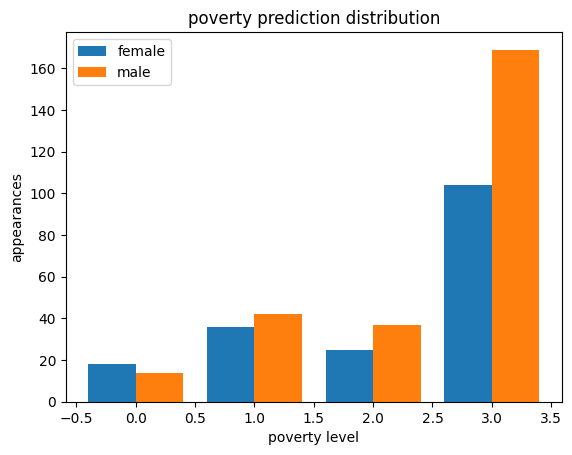

In [ ]:
from collections import Counter
X_axis = np.arange(4)
female_counter = Counter(combo_preds[X_test['female']==1])
female_dist = [v for _,v in sorted(female_counter.items())]
male_counter = Counter(combo_preds[X_test['female']==0])
male_dist = [v for _,v in sorted(male_counter.items())]
plt.bar(X_axis- 0.2, female_dist, 0.4, label = 'female')
plt.bar(X_axis + 0.2, male_dist, 0.4, label = 'male')
plt.title('poverty prediction distribution')
plt.xlabel('poverty level')
plt.ylabel('appearances')
plt.legend()

In [ ]:
# Transform predicted outcomes to a binary variable: either received aids or not

pred_aid = np.array([0 if pred == 3 else 1 for pred in combo_preds])
test_aid = np.array([0 if pred == 3 else 1 for pred in y_test])

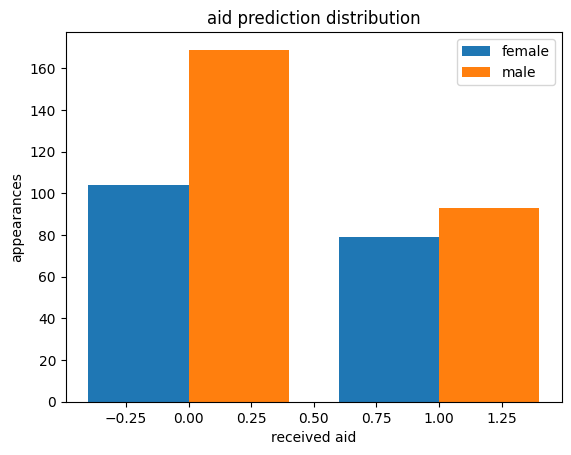

In [ ]:
X_axis = np.arange(2)
female_counter = Counter(pred_aid[X_test['female']==1])
female_dist = [v for _,v in sorted(female_counter.items())]
male_counter = Counter(pred_aid[X_test['female']==0])
male_dist = [v for _,v in sorted(male_counter.items())]
plt.bar(X_axis- 0.2, female_dist, 0.4, label = 'female')
plt.bar(X_axis + 0.2, male_dist, 0.4, label = 'male')
plt.title('aid prediction distribution')
plt.xlabel('received aid')
plt.ylabel('appearances')
plt.legend()

## Fairlearn

Using fairlearn to measure accuracy and fairness.

In [ ]:
  !pip install fairlearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.0/235.0 kB 8.0 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, make_scorer, f1_score
import sklearn.metrics as skm

from fairlearn.datasets import fetch_adult
from fairlearn.preprocessing import CorrelationRemover
from fairlearn.reductions import ExponentiatedGradient
from fairlearn.reductions import GridSearch
from fairlearn.reductions import DemographicParity, ErrorRate
from fairlearn.postprocessing import ThresholdOptimizer
from fairlearn.metrics import MetricFrame
from fairlearn.metrics import (demographic_parity_difference, demographic_parity_ratio, 
                               selection_rate_difference, false_negative_rate_difference, 
                               false_positive_rate_difference, equalized_odds_ratio,
                               false_negative_rate, false_positive_rate)


In [ ]:
import functools
metric_dict = {
    'accuracy': accuracy_score,
    'precision': precision_score,
    'recall': recall_score,
    'f1': f1_score,
}
sample_params = {}

sensitive = X_test['female']
metric_frame_base = MetricFrame(
   metrics=metric_dict,
   y_true=test_aid,
   y_pred=pred_aid,
   sensitive_features=sensitive,
   )



In [ ]:
print('Overall accuracy metrics')
print(metric_frame_base.overall)

Overall accuracy metrics
accuracy     0.919101
precision    0.819767
recall       0.965753
f1           0.886792
dtype: float64


In [ ]:
print('Overall accuracy metrics')
print(metric_frame_base.by_group)

Overall accuracy metrics
        accuracy  precision    recall        f1
female                                         
0       0.912214   0.795699  0.948718  0.865497
1       0.928962   0.848101  0.985294  0.911565


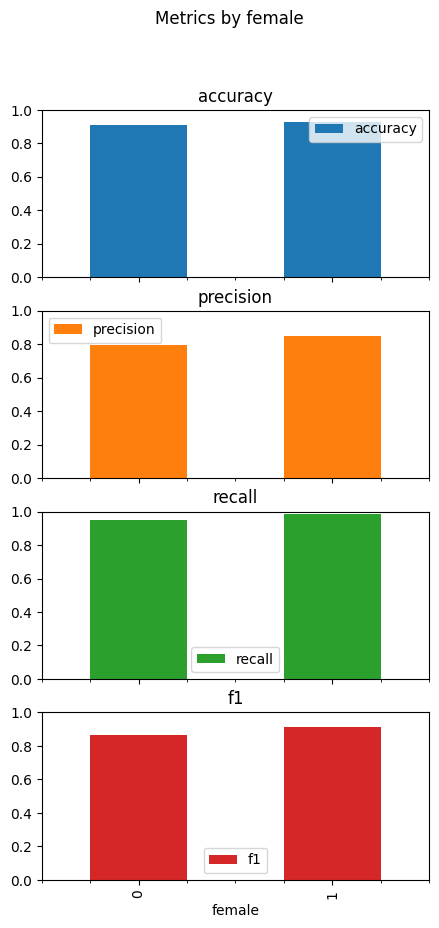

In [ ]:
metric_frame_base.by_group.plot.bar(
    subplots=True, 
    figsize=(5, 10), 
    ylim=[0,1],
    title="Metrics by female",
    )
plt.show()

In [ ]:
fnr_diff_base = false_negative_rate_difference(test_aid,pred_aid,sensitive_features=sensitive)
fpr_diff_base = false_positive_rate_difference(test_aid,pred_aid,sensitive_features=sensitive)
demo_ratio_base = demographic_parity_ratio(test_aid,pred_aid,sensitive_features=sensitive)
odds_ratio_base = equalized_odds_ratio(test_aid,pred_aid,sensitive_features=sensitive)
selection_diff_base = selection_rate_difference(test_aid,pred_aid,sensitive_features=sensitive)
print(f'FNR difference: {fnr_diff_base:.3f}')
print(f'FPR difference: {fpr_diff_base:.3f}')
print(f'demographic parity ratio: {demo_ratio_base:.3f}')
print(f'equalized odds ratio: {odds_ratio_base:.3f}')
print(f'selection rate diff: {selection_diff_base:.3f}')

FNR difference: 0.037
FPR difference: 0.001
demographic parity ratio: 0.822
equalized odds ratio: 0.963
selection rate diff: 0.077


## LIME
Using LIME to interpret the model's decision making.

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import lime
import lime.lime_tabular
from lime import submodular_pick
import xgboost
from xgboost import plot_importance
import json
from collections import OrderedDict


In [ ]:
categorical_features  = [i for i in range(len(X_train.dtypes)) if X_train.dtypes[i]=='object']
categorical_features  

[]

In [ ]:
xgb_del = [X_test.columns.get_loc(d) for d in xgb_drop_cols]
et_del = [X_test.columns.get_loc(d) for d in et_drop_cols]

In [ ]:

def combine_voters_proba(data, weights=[0.5, 0.5]):
    xgb_data = [np.delete(array, xgb_del) for array in data]
    et_data = [np.delete(array, et_del) for array in data]
    # do soft voting with both classifiers
    vc.voting="soft"
    vc1_probs = vc.predict_proba(pd.DataFrame(xgb_data, columns=X_train.drop(xgb_drop_cols, axis=1).columns))
    vc2.voting="soft"
    vc2_probs = vc2.predict_proba(pd.DataFrame(et_data, columns=X_train.drop(et_drop_cols, axis=1).columns)) 
    
    final_vote = (vc1_probs * weights[0]) + (vc2_probs * weights[1])

    return np.array([[d, sum([a,b,c])] for a,b,c,d in final_vote])

In [ ]:
X_train = X_train.fillna(0)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                   feature_names=X_train.columns,
                                                   class_names=np.array(['no aid','received aid']),
                                                   discretize_continuous=False,
                                                   categorical_features=categorical_features, 
                                                   categorical_names=[])

sp_obj = submodular_pick.SubmodularPick(explainer, X_train.values, predict_fn, sample_size=10, 
                                        num_features=5, num_exps_desired=5)


In [ ]:
sp_obj.V

[8, 9, 7, 6, 5]

In [ ]:
X_test_valid = X_test.fillna(0)
for ind in sp_obj.V:
    exp = explainer.explain_instance(X_test_valid.values[ind], predict_fn, num_features=5)
    print("Actual class: ", test_aid[ind])
    exp.show_in_notebook(show_all=False)
    print("==========================")

Actual class:  0


Actual class:  0


Actual class:  1


Actual class:  0


Actual class:  1
